In [5]:
import sys, os

try:
  import google.colab
  colab = True
except:
  colab = False
import timeit
import platform
import os
import sys

if colab is True:
    from google.colab.patches import cv2_imshow
    
# Operating System
OS = platform.system()                                                               # returns 'Windows', 'Linux', etc

start_download_time = timeit.default_timer()
if not os.path.exists("./test_images.zip"):
    os.system('gdown --id "1xBtpKAKvW8xnyyzzSYUkhfp1g4cf_M0e" --output "./test_images.zip"')
    if OS == "Linux":
        os.system('unzip -o -n "./test_images.zip" -d "./"')

if not os.path.exists("./TrainedWpodNetModels.zip"):
    os.system('gdown --id "1Gn_dfzUX5CmVkca5DbcPeLEjud9dAcxU" --output "./TrainedWpodNetModels.zip"')
    if OS == "Linux":
        os.system('unzip -o -n "./TrainedWpodNetModels.zip" -d "./"')
print("Download and Unzip of Dataset and Models Time : ", timeit.default_timer() - start_download_time)

Download and Unzip of Dataset and Models Time :  0.00016271100002995809


In [6]:
import keras
import cv2
import traceback
import pdb
import numpy as np

from src.keras_utils import load_model
from glob import glob
from os.path import splitext, basename
from src.utils import im2single
from src.keras_utils import load_model, detect_lp
from src.label import Shape, writeShapes
import matplotlib.pyplot as plt

In [7]:
def adjust_pts(pts,lroi):
  return pts*lroi.wh().reshape((2,1)) + lroi.tl().reshape((2,1))

lp_threshold = .5
input_dir = "Images"
wpod_net_path = "./TrainedWpodNetModels/wpod-net_100k_moto_dataset_best.json"
wpod_net = load_model(wpod_net_path)

imgs_paths = glob('%s/*.jpg' % input_dir)
print(imgs_paths)
print('Searching for license plates using WPOD-NET')

['Images/20210303_101823.jpg', 'Images/20210303_100833.jpg', 'Images/20210302_181128.jpg', 'Images/20210302_181736.jpg', 'Images/20210303_102031.jpg', 'Images/20210303_111327.jpg', 'Images/20210302_181347.jpg', 'Images/20210303_101903.jpg', 'Images/20210302_181434.jpg', 'Images/20210302_181418.jpg', 'Images/20210302_180904.jpg', 'Images/20210302_180928.jpg', 'Images/20210302_180958.jpg', 'Images/20210302_182310.jpg', 'Images/20210302_181400.jpg', 'Images/20210303_111317.jpg', 'Images/20210303_111447.jpg', 'Images/20210302_181254.jpg', 'Images/20210302_181106.jpg', 'Images/20210303_111037.jpg', 'Images/20210303_101709.jpg', 'Images/20210302_181637.jpg', 'Images/20210303_111453.jpg', 'Images/20210302_180949.jpg', 'Images/20210303_100946.jpg', 'Images/20210303_111127.jpg', 'Images/20210303_111001.jpg', 'Images/20210303_101733.jpg', 'Images/20210302_182920.jpg', 'Images/20210302_182231.jpg', 'Images/20210303_111115.jpg', 'Images/20210303_110936.jpg', 'Images/20210302_181315.jpg', 'Images/2

	 Processing Images/20210303_101823.jpg
		Bound dim: 526, ratio: 1.775730


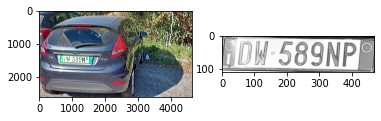

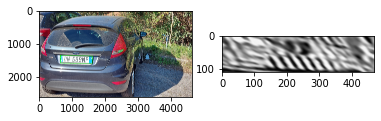

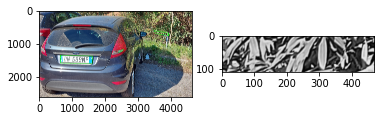

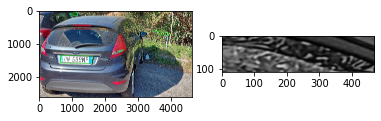

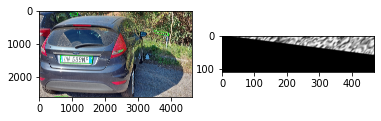

	 Processing Images/20210303_100833.jpg
		Bound dim: 526, ratio: 1.775730


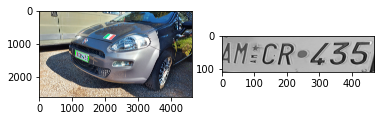

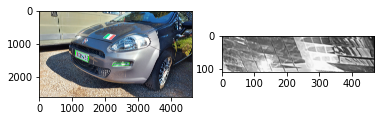

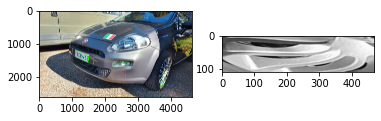

	 Processing Images/20210302_181128.jpg
		Bound dim: 526, ratio: 1.775730


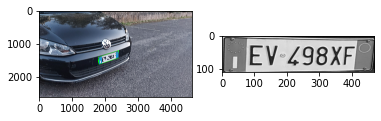

	 Processing Images/20210302_181736.jpg
		Bound dim: 526, ratio: 1.775730


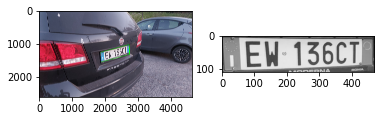

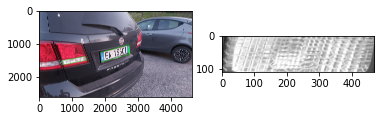

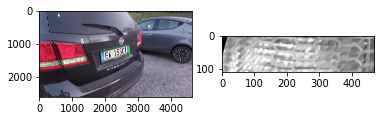

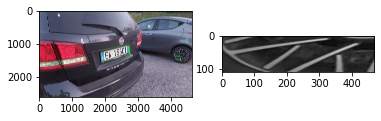

	 Processing Images/20210303_102031.jpg
		Bound dim: 526, ratio: 1.775730


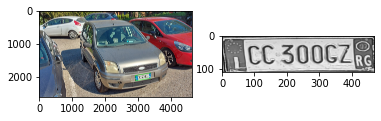

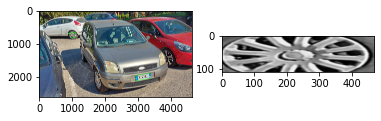

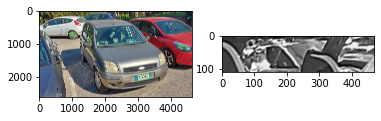

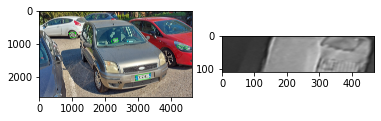

	 Processing Images/20210303_111327.jpg
		Bound dim: 526, ratio: 1.775730


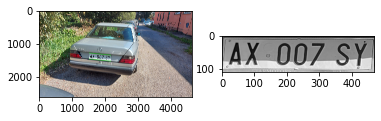

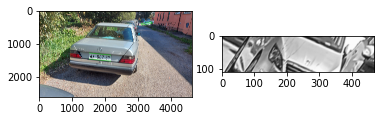

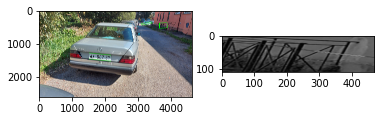

	 Processing Images/20210302_181347.jpg
		Bound dim: 526, ratio: 1.775730


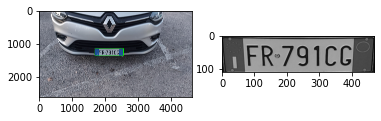

	 Processing Images/20210303_101903.jpg
		Bound dim: 526, ratio: 1.775730


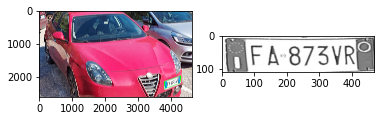

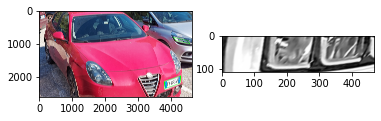

	 Processing Images/20210302_181434.jpg
		Bound dim: 526, ratio: 1.775730


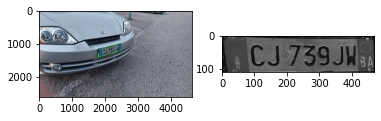

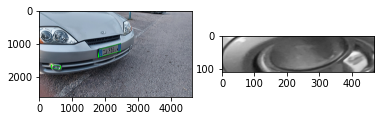

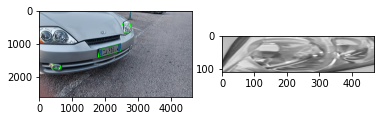

	 Processing Images/20210302_181418.jpg
		Bound dim: 526, ratio: 1.775730


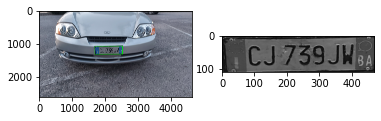

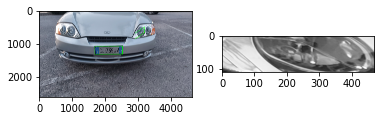

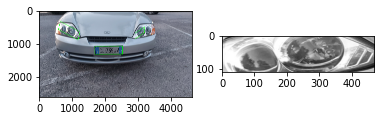

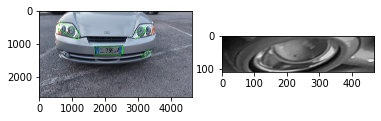

	 Processing Images/20210302_180904.jpg
		Bound dim: 526, ratio: 1.776199


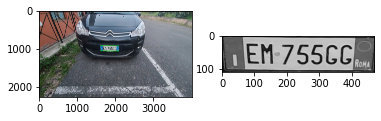

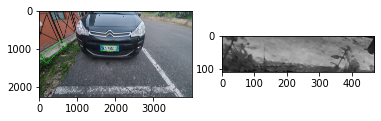

	 Processing Images/20210302_180928.jpg
		Bound dim: 526, ratio: 1.776199


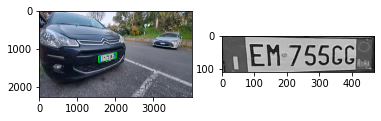

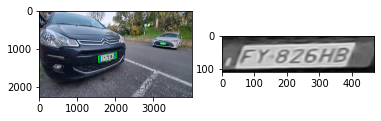

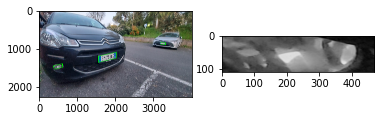

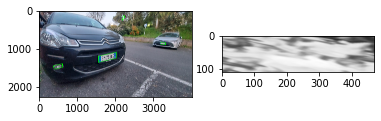

	 Processing Images/20210302_180958.jpg
		Bound dim: 526, ratio: 1.776199


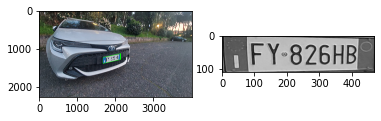

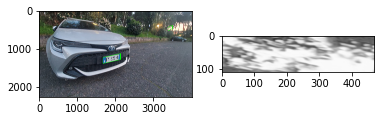

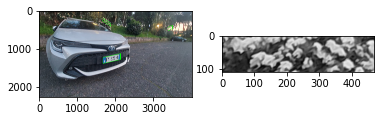

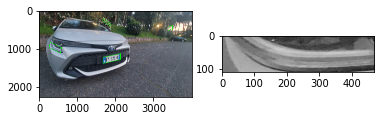

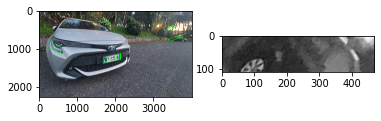

	 Processing Images/20210302_182310.jpg
		Bound dim: 526, ratio: 1.775730


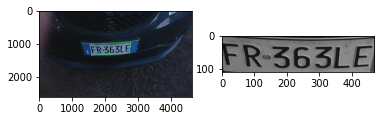

	 Processing Images/20210302_181400.jpg
		Bound dim: 526, ratio: 1.775730


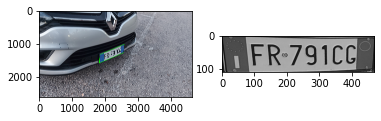

	 Processing Images/20210303_111317.jpg
		Bound dim: 526, ratio: 1.775730


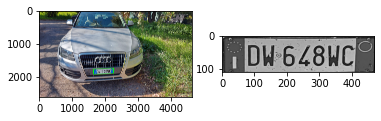

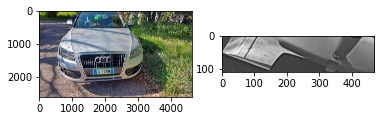

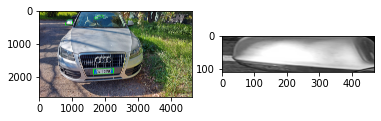

	 Processing Images/20210303_111447.jpg
		Bound dim: 526, ratio: 1.775730


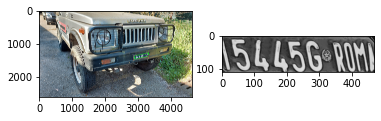

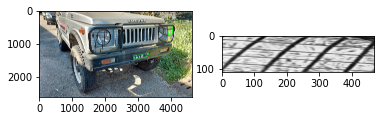

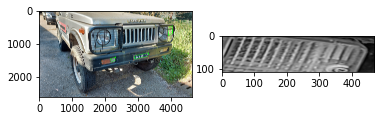

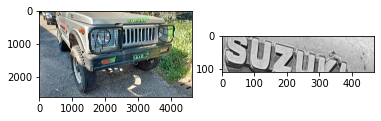

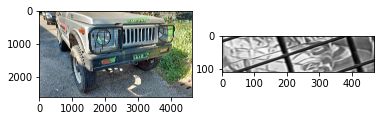

	 Processing Images/20210302_181254.jpg
		Bound dim: 526, ratio: 1.775730


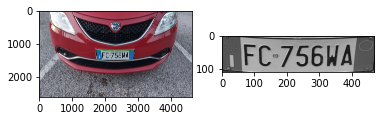

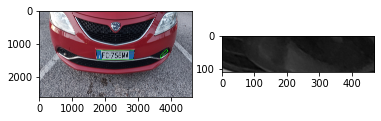

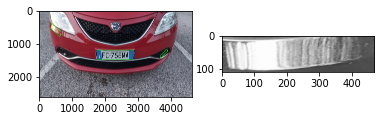

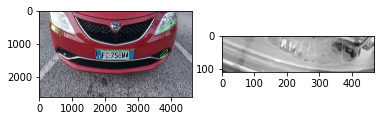

	 Processing Images/20210302_181106.jpg
		Bound dim: 526, ratio: 1.775730


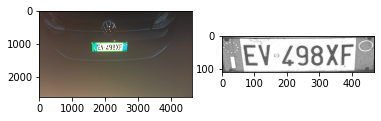

	 Processing Images/20210303_111037.jpg
		Bound dim: 526, ratio: 1.775730


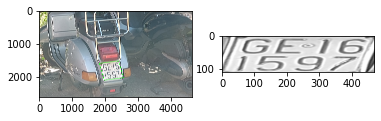

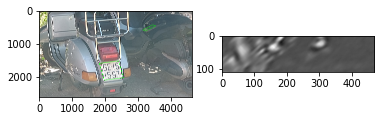

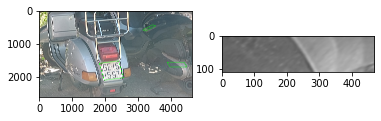

	 Processing Images/20210303_101709.jpg
		Bound dim: 526, ratio: 1.775730


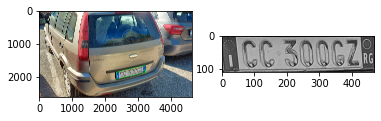

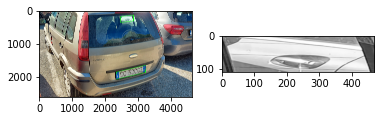

	 Processing Images/20210302_181637.jpg
		Bound dim: 526, ratio: 1.775730


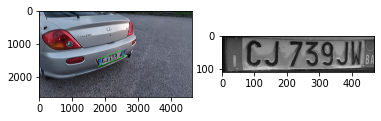

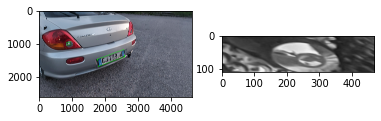

	 Processing Images/20210303_111453.jpg
		Bound dim: 526, ratio: 1.775730


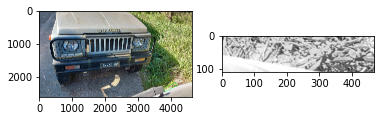

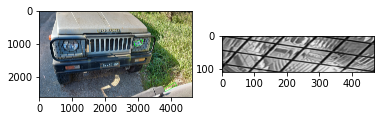

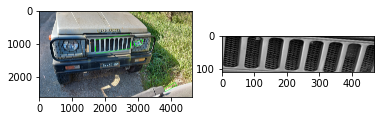

	 Processing Images/20210302_180949.jpg
		Bound dim: 526, ratio: 1.776199


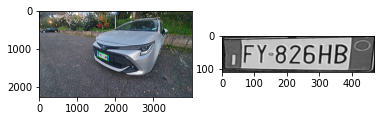

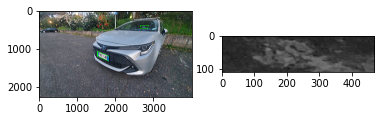

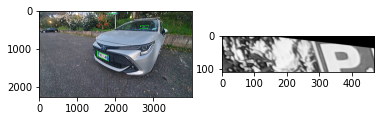

	 Processing Images/20210303_100946.jpg
		Bound dim: 526, ratio: 1.775730


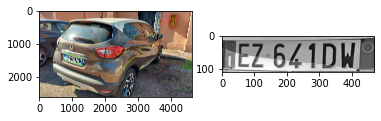

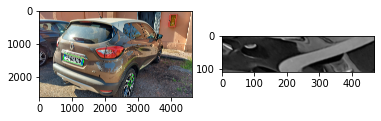

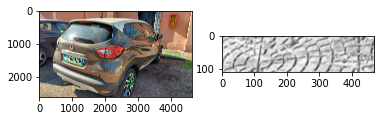

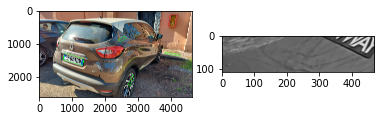

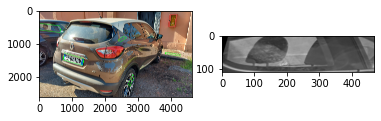

	 Processing Images/20210303_111127.jpg
		Bound dim: 526, ratio: 1.775730


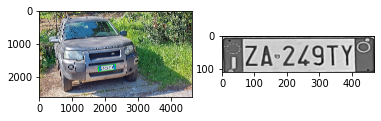

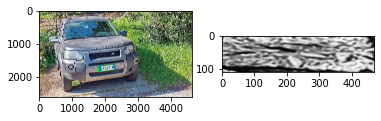

	 Processing Images/20210303_111001.jpg
		Bound dim: 526, ratio: 1.775730


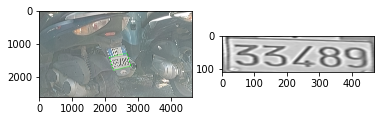

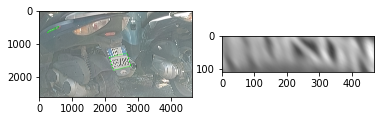

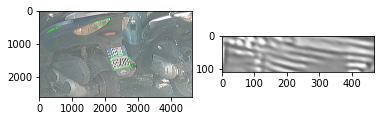

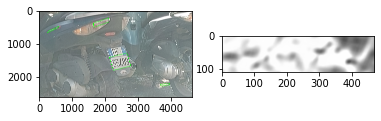

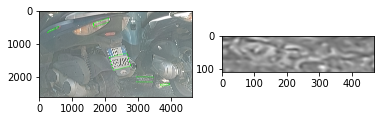

	 Processing Images/20210303_101733.jpg
		Bound dim: 526, ratio: 1.775730


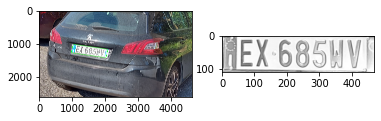

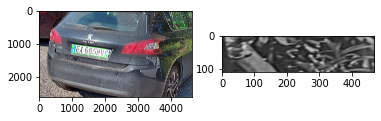

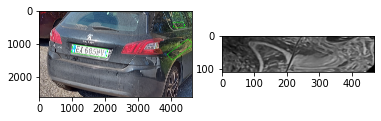

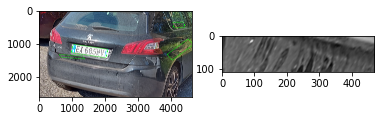

	 Processing Images/20210302_182920.jpg
		Bound dim: 526, ratio: 1.775730


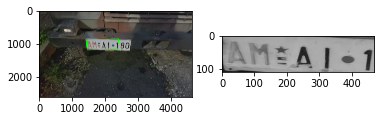

	 Processing Images/20210302_182231.jpg
		Bound dim: 526, ratio: 1.775730


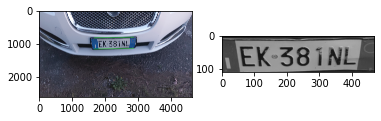

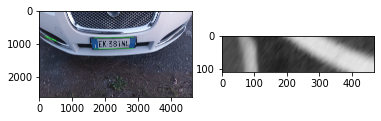

	 Processing Images/20210303_111115.jpg
		Bound dim: 526, ratio: 1.775730


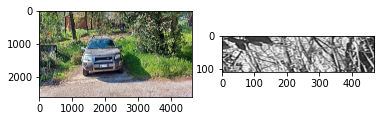

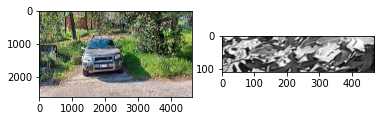

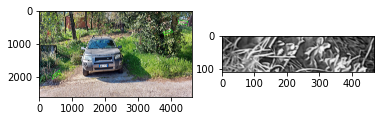

	 Processing Images/20210303_110936.jpg
		Bound dim: 526, ratio: 1.775730


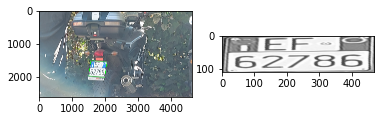

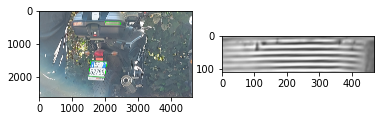

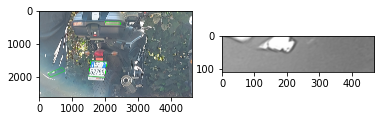

	 Processing Images/20210302_181315.jpg
		Bound dim: 526, ratio: 1.775730


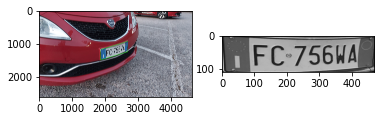

	 Processing Images/20210302_182803.jpg
		Bound dim: 526, ratio: 1.775730


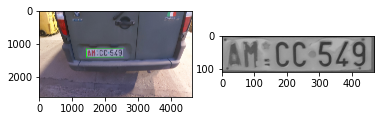

	 Processing Images/20210302_181729.jpg
		Bound dim: 526, ratio: 1.775730


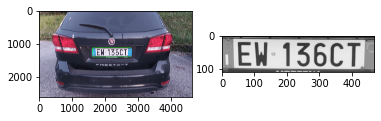

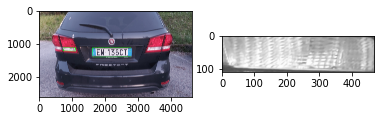

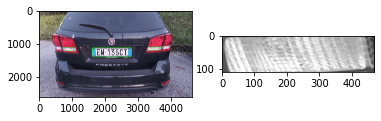

	 Processing Images/20210302_181353.jpg
		Bound dim: 526, ratio: 1.775730


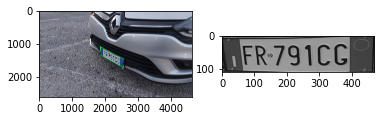

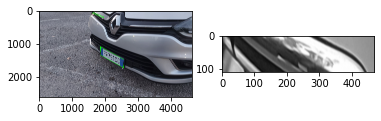

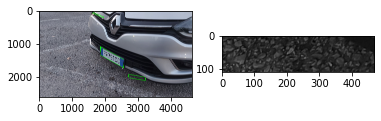

	 Processing Images/20210303_100800.jpg
		Bound dim: 526, ratio: 1.775730


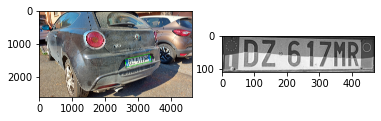

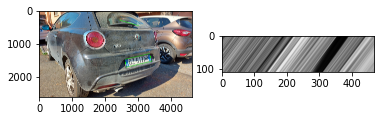

	 Processing Images/20210303_111338.jpg
		Bound dim: 526, ratio: 1.775730


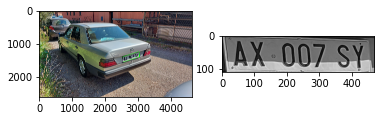

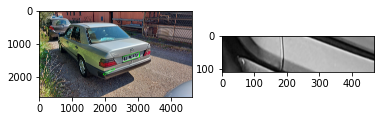

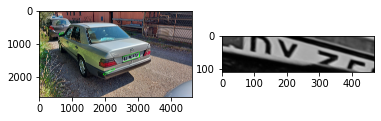

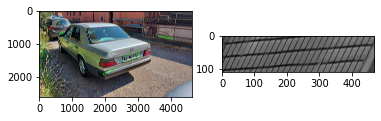

	 Processing Images/20210303_100851.jpg
		Bound dim: 526, ratio: 1.775730


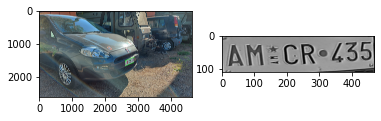

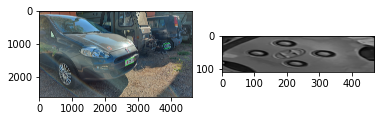

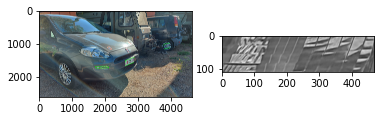

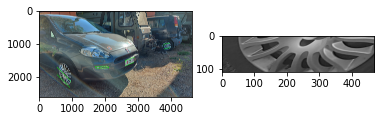

	 Processing Images/20210302_181119.jpg
		Bound dim: 526, ratio: 1.775730


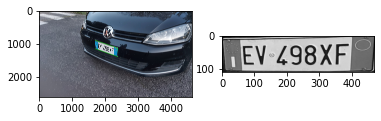

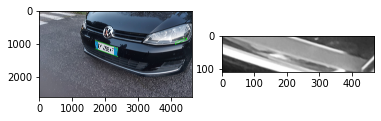

	 Processing Images/20210303_101407.jpg
		Bound dim: 526, ratio: 1.775730


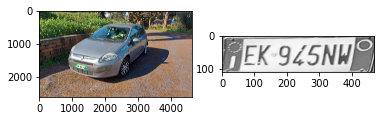

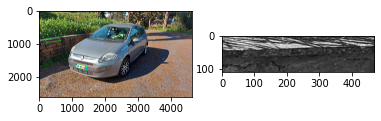

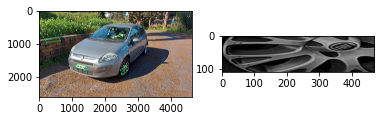

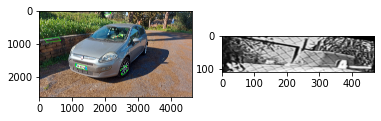

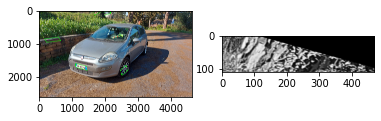

	 Processing Images/20210303_101031.jpg
		Bound dim: 526, ratio: 1.775730


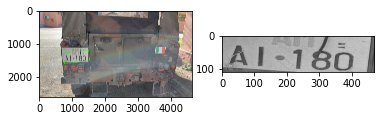

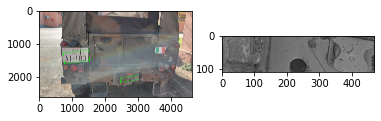

	 Processing Images/20210302_181027.jpg
		Bound dim: 526, ratio: 1.776199


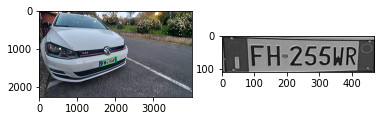

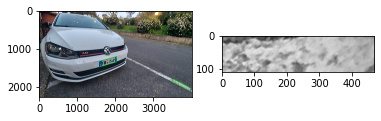

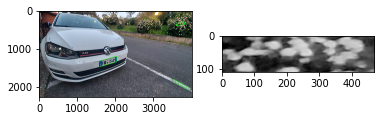

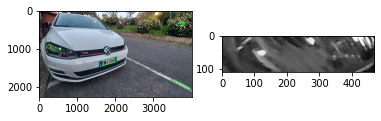

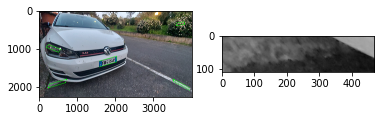

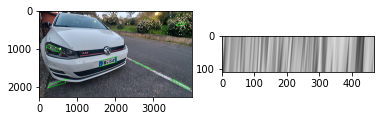

	 Processing Images/20210302_180801.jpg
		Bound dim: 526, ratio: 1.775730


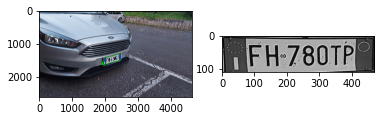

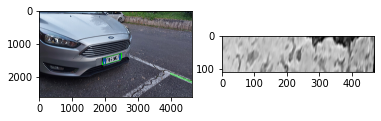

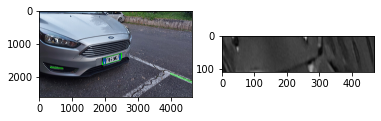

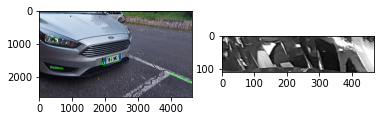

	 Processing Images/20210302_183239.jpg
		Bound dim: 526, ratio: 1.775730


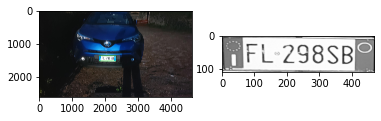

	 Processing Images/20210303_101340.jpg
		Bound dim: 526, ratio: 1.775730


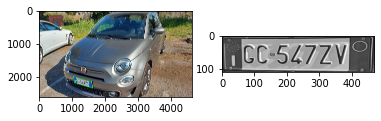

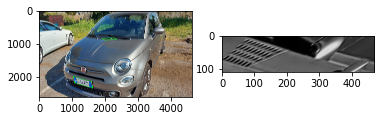

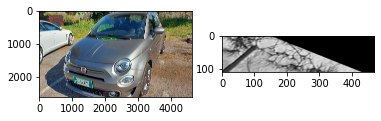

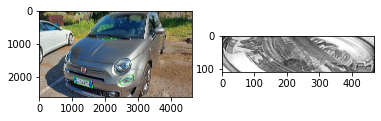

	 Processing Images/20210303_101349.jpg
		Bound dim: 526, ratio: 1.775730


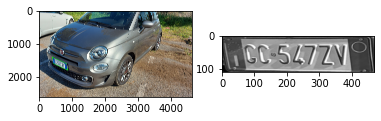

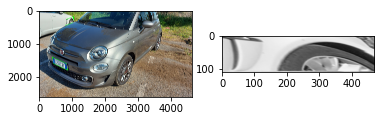

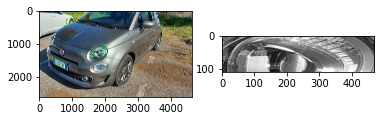

	 Processing Images/20210303_111135.jpg
		Bound dim: 526, ratio: 1.775730


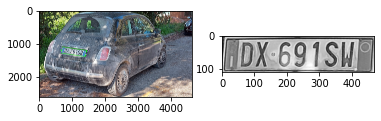

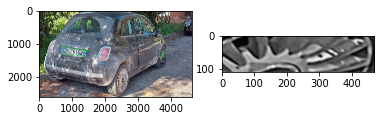

	 Processing Images/20210302_180639.jpg
		Bound dim: 526, ratio: 1.775730


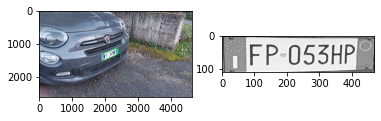

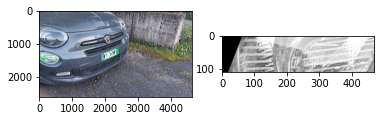

	 Processing Images/20210303_111428.jpg
		Bound dim: 526, ratio: 1.775730


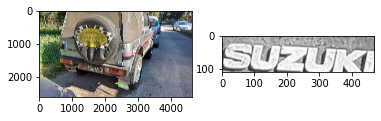

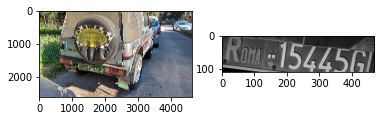

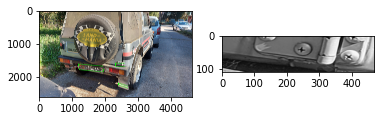

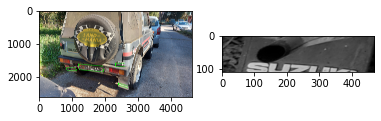

	 Processing Images/20210303_111432.jpg
		Bound dim: 526, ratio: 1.775730


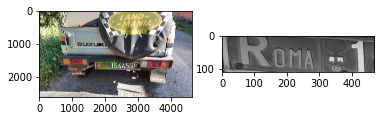

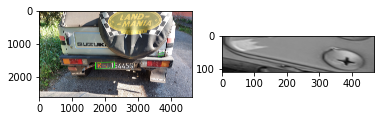

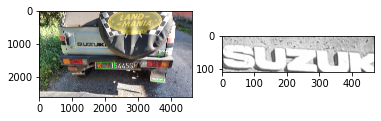

	 Processing Images/20210302_182116.jpg
		Bound dim: 526, ratio: 1.775730


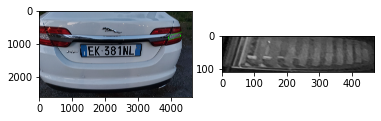

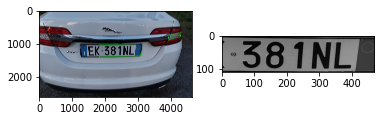

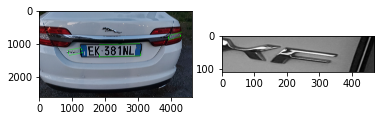

	 Processing Images/20210303_111304.jpg
		Bound dim: 526, ratio: 1.775730


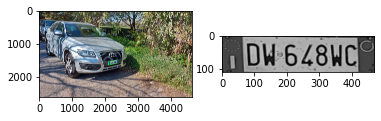

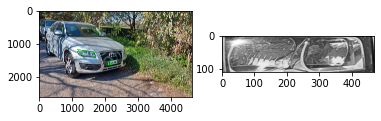

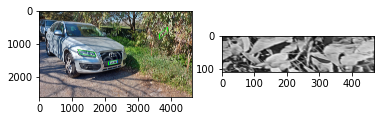

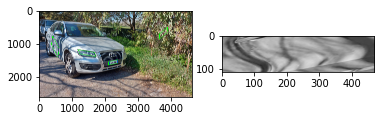

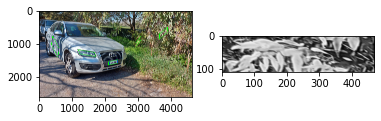

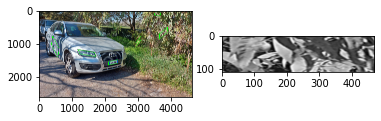

	 Processing Images/20210303_101223.jpg
		Bound dim: 526, ratio: 1.775730


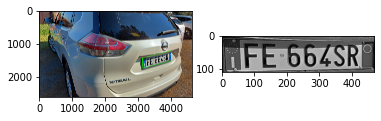

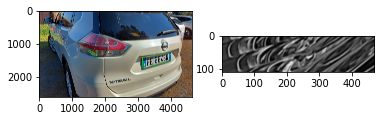

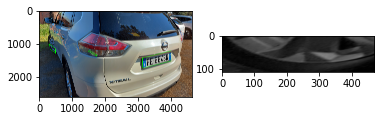

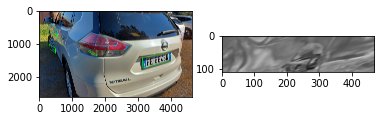

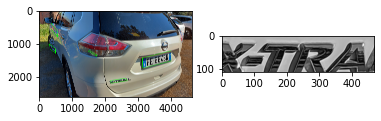

	 Processing Images/20210302_180544.jpg
		Bound dim: 384, ratio: 1.333333


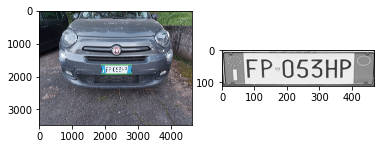

	 Processing Images/20210303_111022.jpg
		Bound dim: 526, ratio: 1.775730


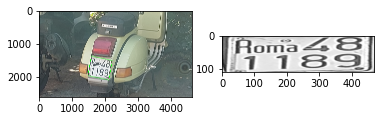

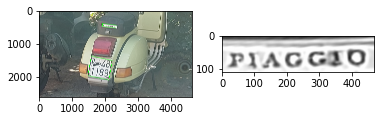

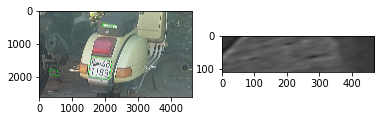

	 Processing Images/20210302_182159.jpg
		Bound dim: 526, ratio: 1.775730


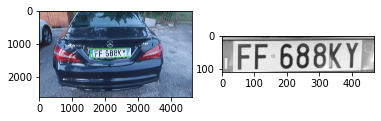

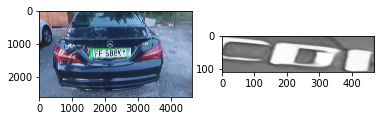

	 Processing Images/20210303_110946.jpg
		Bound dim: 526, ratio: 1.775730


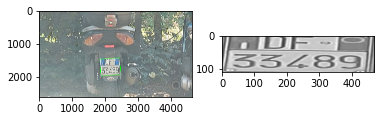

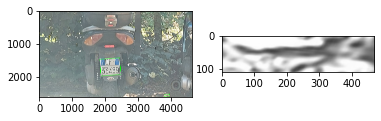

	 Processing Images/20210302_181224.jpg
		Bound dim: 526, ratio: 1.775730


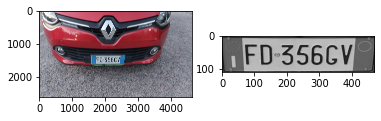

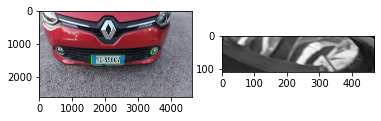

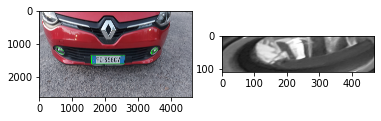

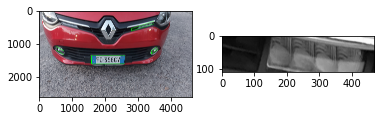

	 Processing Images/20210302_180747.jpg
		Bound dim: 526, ratio: 1.775730


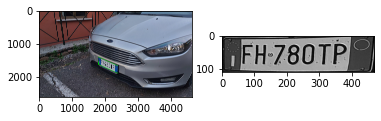

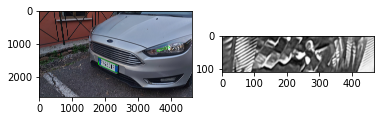

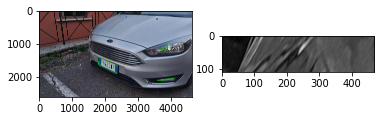

	 Processing Images/20210303_111511.jpg
		Bound dim: 526, ratio: 1.775730


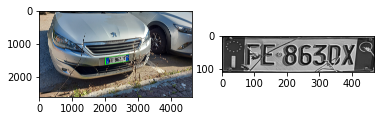

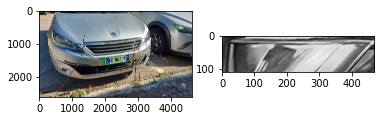

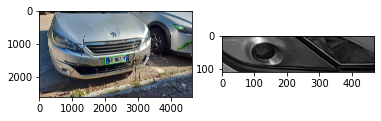

	 Processing Images/20210303_101311.jpg
		Bound dim: 526, ratio: 1.775730


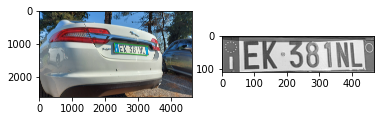

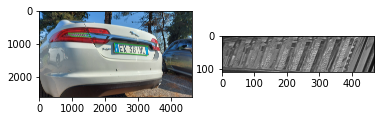

	 Processing Images/20210302_181627.jpg
		Bound dim: 526, ratio: 1.775730


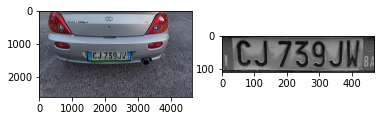

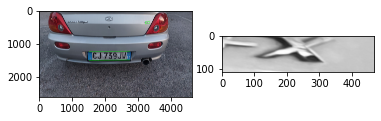

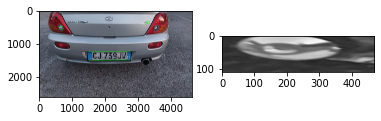

	 Processing Images/20210302_180849.jpg
		Bound dim: 526, ratio: 1.776199


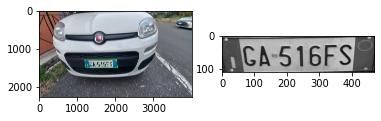

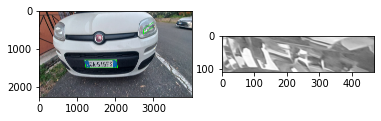

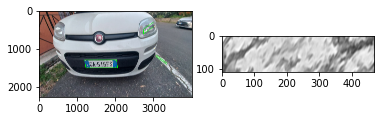

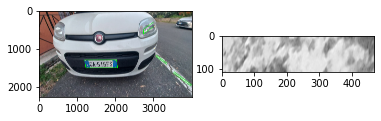

	 Processing Images/20210302_180701.jpg
		Bound dim: 526, ratio: 1.775730


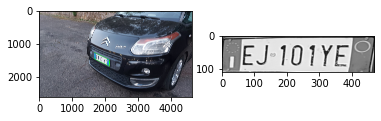

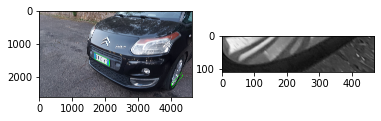

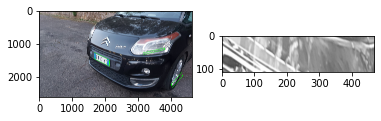

	 Processing Images/20210302_180843.jpg
		Bound dim: 526, ratio: 1.776199


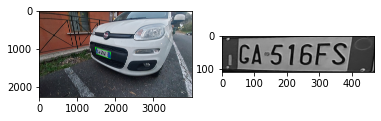

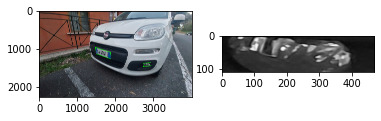

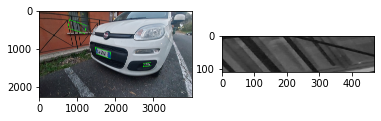

	 Processing Images/20210302_181012.jpg
		Bound dim: 526, ratio: 1.776199


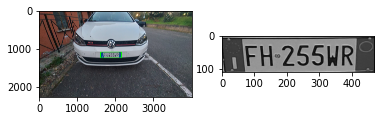

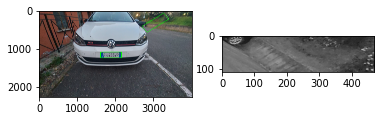

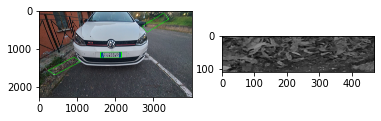

	 Processing Images/20210302_182735.jpg
		Bound dim: 526, ratio: 1.775730


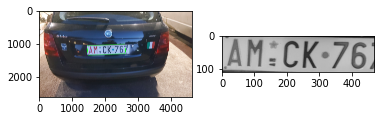

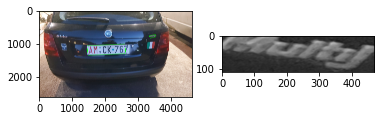

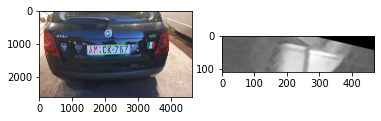

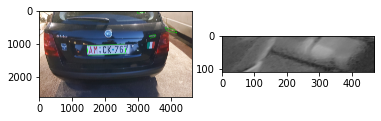

	 Processing Images/20210302_181427.jpg
		Bound dim: 526, ratio: 1.775730


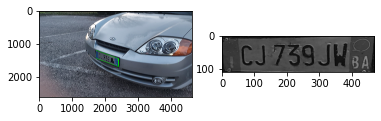

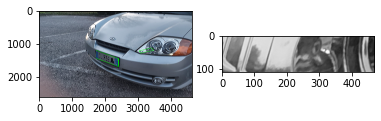

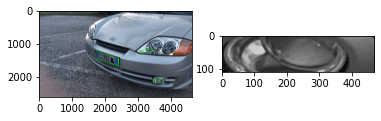

	 Processing Images/20210302_183708.jpg
		Bound dim: 526, ratio: 1.775730


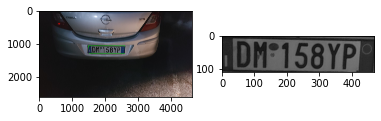

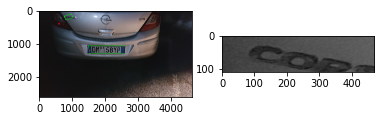

	 Processing Images/20210303_111217.jpg
		Bound dim: 526, ratio: 1.775730


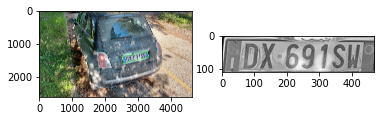

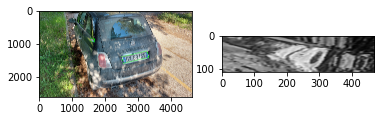

	 Processing Images/20210302_180739.jpg
		Bound dim: 526, ratio: 1.775730


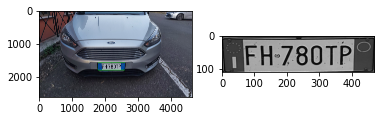

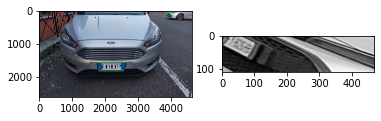

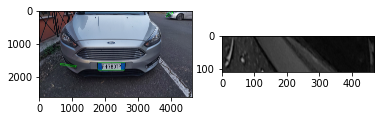

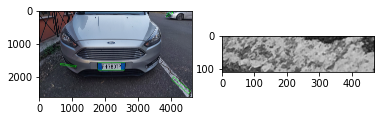

	 Processing Images/20210302_182537.jpg
		Bound dim: 526, ratio: 1.775730


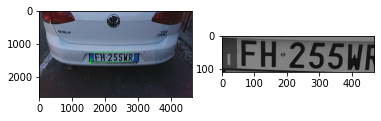

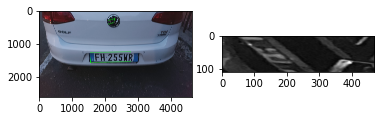

	 Processing Images/20210302_180916.jpg
		Bound dim: 526, ratio: 1.776199


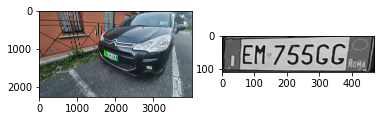

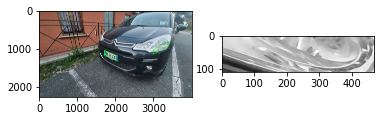

	 Processing Images/20210303_111045.jpg
		Bound dim: 526, ratio: 1.775730


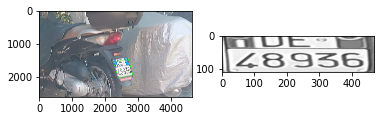

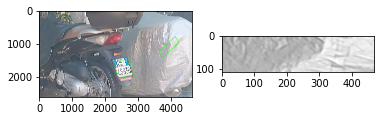

	 Processing Images/20210302_182513.jpg
		Bound dim: 526, ratio: 1.775730


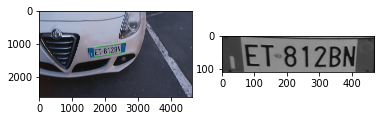

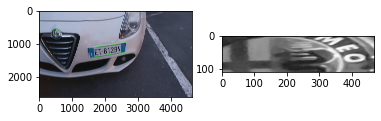

	 Processing Images/20210303_101907.jpg
		Bound dim: 526, ratio: 1.775730


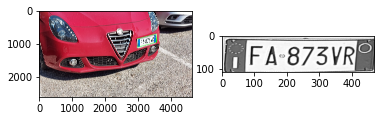

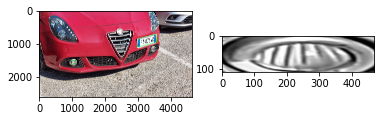

	 Processing Images/20210303_101213.jpg
		Bound dim: 526, ratio: 1.775730


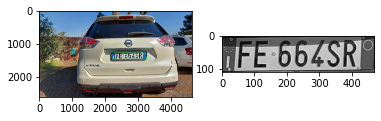

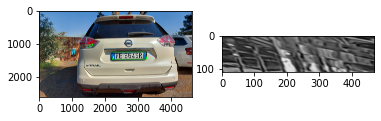

	 Processing Images/20210303_101020.jpg
		Bound dim: 526, ratio: 1.775730


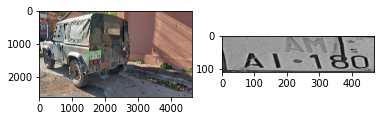

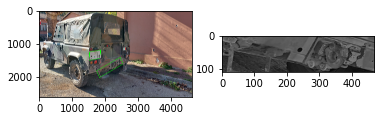

	 Processing Images/20210302_181301.jpg
		Bound dim: 526, ratio: 1.775730


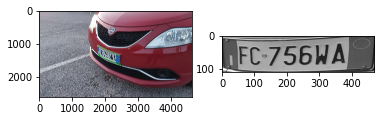

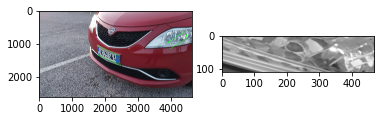

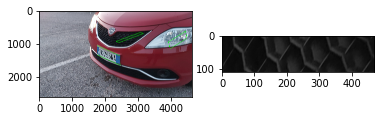

	 Processing Images/20210302_182338.jpg
		Bound dim: 526, ratio: 1.775730


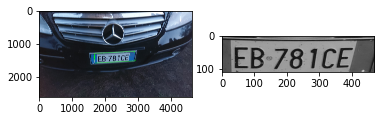

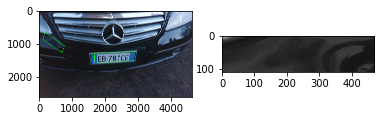

	 Processing Images/20210303_101320.jpg
		Bound dim: 526, ratio: 1.775730


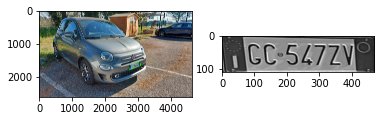

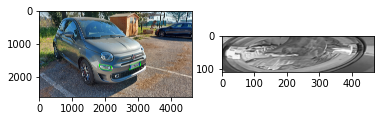

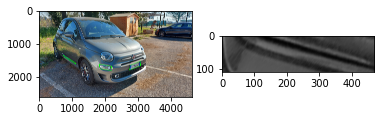

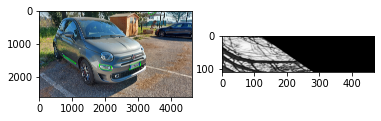

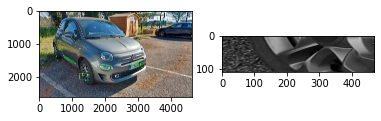

	 Processing Images/20210302_180613.jpg
		Bound dim: 526, ratio: 1.775730


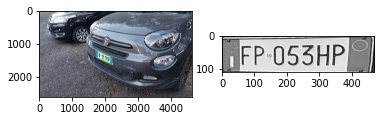

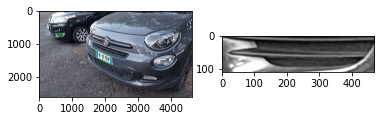

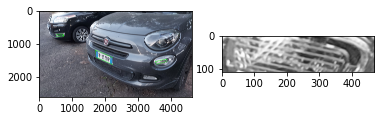

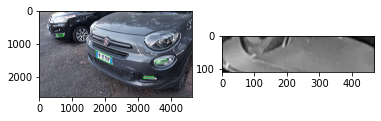

	 Processing Images/20210302_180653.jpg
		Bound dim: 526, ratio: 1.775730


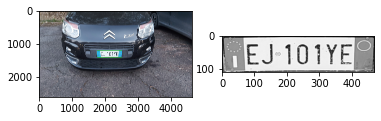

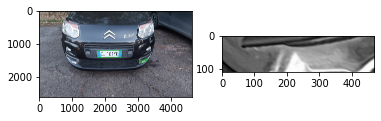

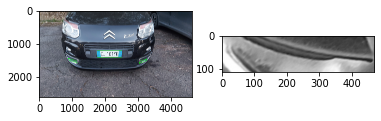

	 Processing Images/20210303_111056.jpg
		Bound dim: 526, ratio: 1.775730


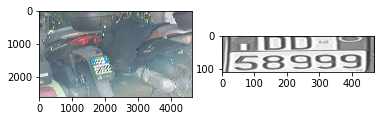

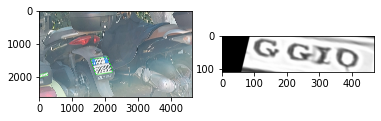

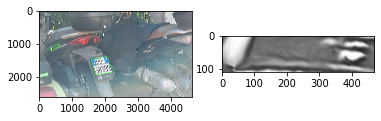

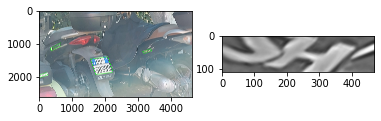

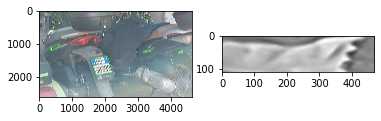

	 Processing Images/20210303_101728.jpg
		Bound dim: 526, ratio: 1.775730


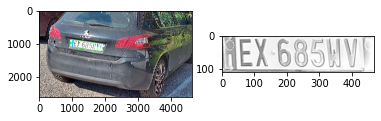

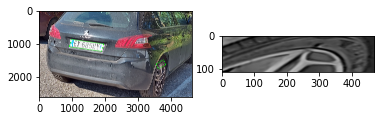

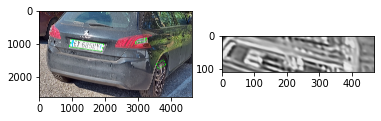

	 Processing Images/20210303_101933.jpg
		Bound dim: 526, ratio: 1.775730


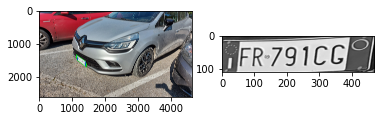

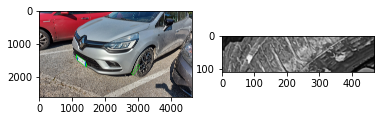

	 Processing Images/20210302_181816.jpg
		Bound dim: 526, ratio: 1.775730


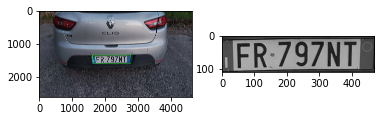

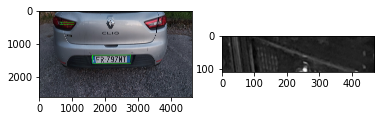

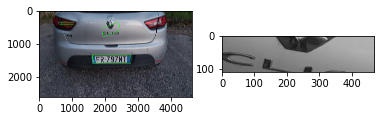

	 Processing Images/20210303_111404.jpg
		Bound dim: 526, ratio: 1.775730


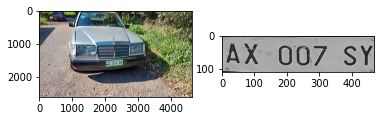

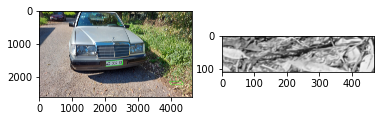

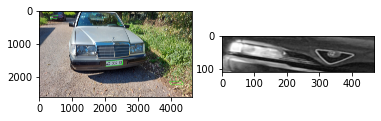

	 Processing Images/20210303_111224.jpg
		Bound dim: 526, ratio: 1.775730


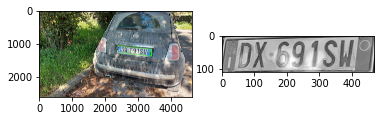

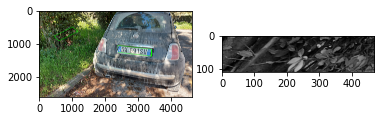

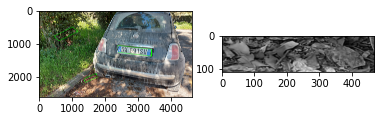

	 Processing Images/20210303_101946.jpg
		Bound dim: 526, ratio: 1.775730


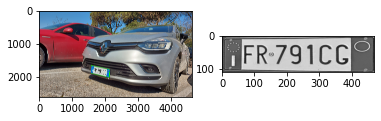

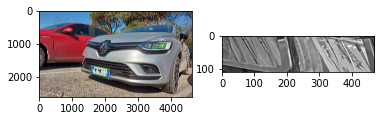

	 Processing Images/20210302_182029.jpg
		Bound dim: 526, ratio: 1.775730


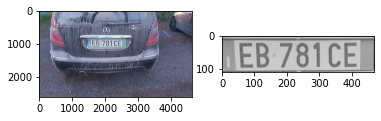

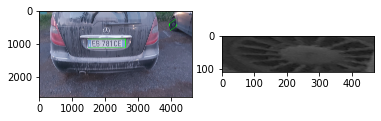

	 Processing Images/20210302_181710.jpg
		Bound dim: 526, ratio: 1.775730


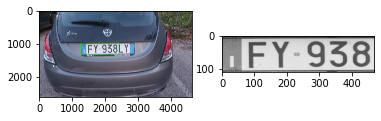

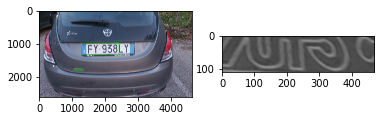

	 Processing Images/20210302_181651.jpg
		Bound dim: 526, ratio: 1.775730


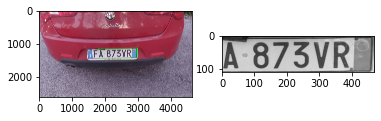

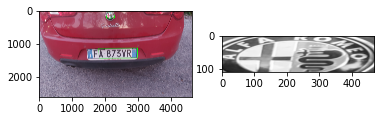

	 Processing Images/20210302_180719.jpg
		Bound dim: 526, ratio: 1.775730


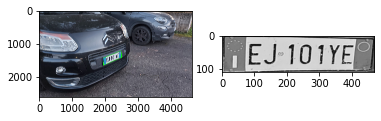

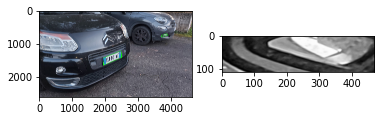

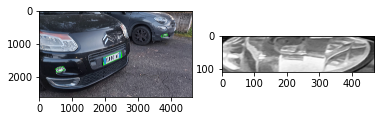

	 Processing Images/20210303_101521.jpg
		Bound dim: 526, ratio: 1.775730


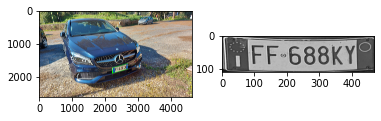

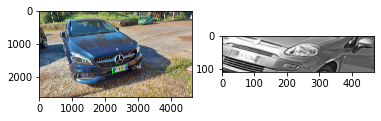

	 Processing Images/20210303_111521.jpg
		Bound dim: 526, ratio: 1.775730


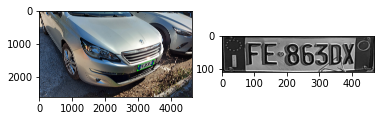

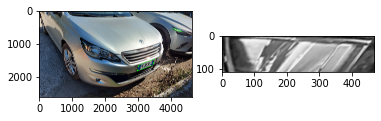

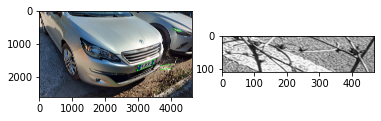

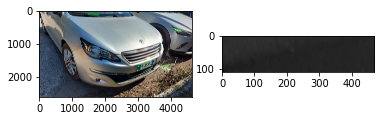

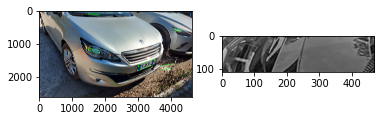

	 Processing Images/20210302_181754.jpg
		Bound dim: 526, ratio: 1.775730


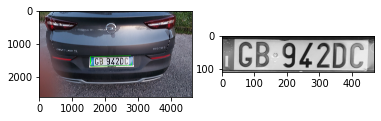

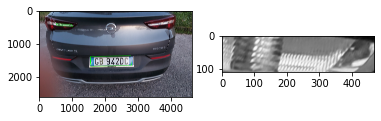

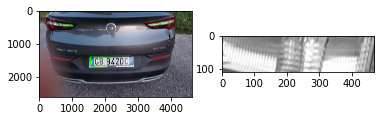

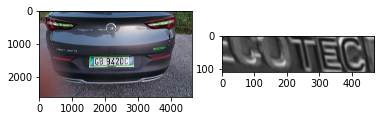

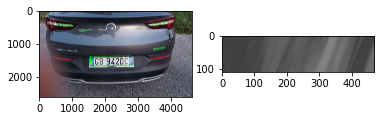

	 Processing Images/20210302_180939.jpg
		Bound dim: 526, ratio: 1.776199


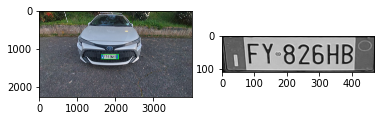

	 Processing Images/20210303_111358.jpg
		Bound dim: 526, ratio: 1.775730


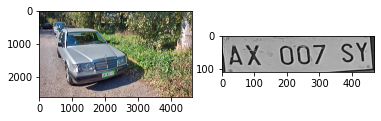

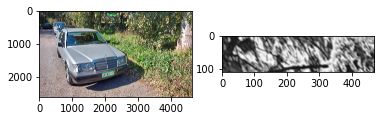

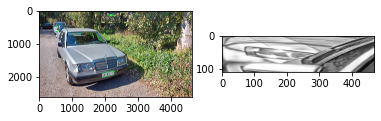

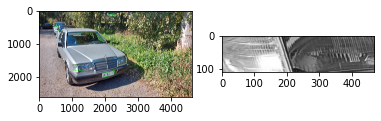

	 Processing Images/20210303_101802.jpg
		Bound dim: 526, ratio: 1.775730


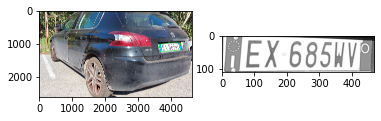

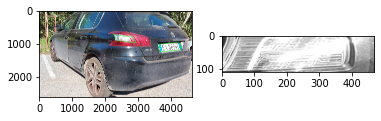

	 Processing Images/20210302_182139.jpg
		Bound dim: 526, ratio: 1.775730


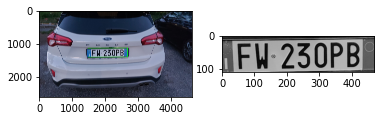

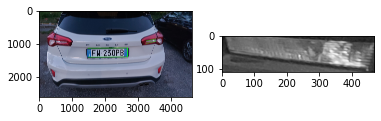

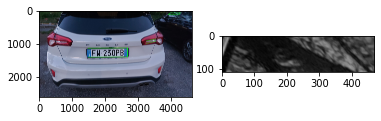

	 Processing Images/20210303_111411.jpg
		Bound dim: 526, ratio: 1.775730


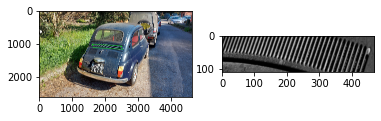

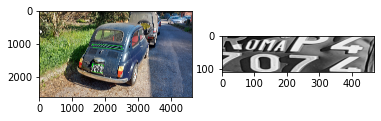

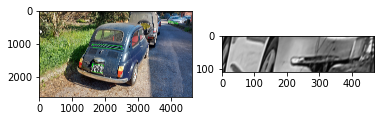

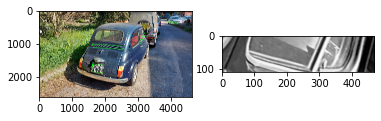

	 Processing Images/20210302_181658.jpg
		Bound dim: 526, ratio: 1.775730


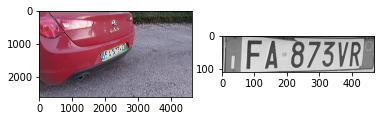

	 Processing Images/20210302_181019.jpg
		Bound dim: 526, ratio: 1.776199


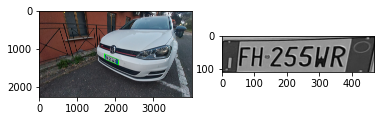

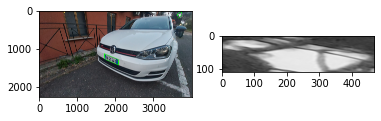

	 Processing Images/20210303_111444.jpg
		Bound dim: 526, ratio: 1.775730


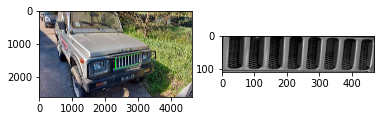

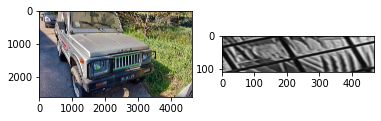

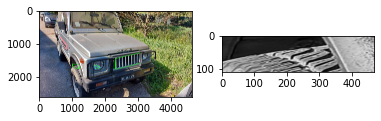

In [8]:
for i,img_path in enumerate(imgs_paths):

  print('\t Processing %s' % img_path)

  bname = splitext(basename(img_path))[0]
  Ivehicle = cv2.imread(img_path)
  
  ratio = float(max(Ivehicle.shape[:2]))/min(Ivehicle.shape[:2])
  side  = int(ratio*288.)
  bound_dim = min(side + (side%(2**4)),608)
  print("\t\tBound dim: %d, ratio: %f" % (bound_dim,ratio))


  Llp,LlpImgs,_ = detect_lp(wpod_net,im2single(Ivehicle.copy()),bound_dim,2**4,(470, 110),lp_threshold)

  if len(LlpImgs):
    for i, lpImg in enumerate(LlpImgs): # print all predictions
      Ilp = lpImg
      Ilp = cv2.cvtColor(Ilp, cv2.COLOR_BGR2GRAY)
      Ilp = cv2.cvtColor(Ilp, cv2.COLOR_GRAY2BGR)
      c = Llp[i].pts
      h,w, _ = Ivehicle.shape
      pts = np.array([[c[0][0]*w, c[1][0]*h],
                  [c[0][1]*w, c[1][1]*h],
                  [c[0][2]*w, c[1][2]*h],
                  [c[0][3]*w, c[1][3]*h]], np.int32)

      pts = pts.reshape((-1, 1, 2))
      Ivehicle = cv2.polylines(Ivehicle, [pts], True, (0, 255, 0), 10)
      
      plt.subplot(1, 2, 1)
      plt.imshow(Ivehicle[...,::-1])
    
      s = Shape(c)

      plt.subplot(1, 2, 2)
      plt.imshow(Ilp)
      plt.show()